# Supervised vs Unsupervised Learning

 We want to predict count of bikes that will be rented in a city every day

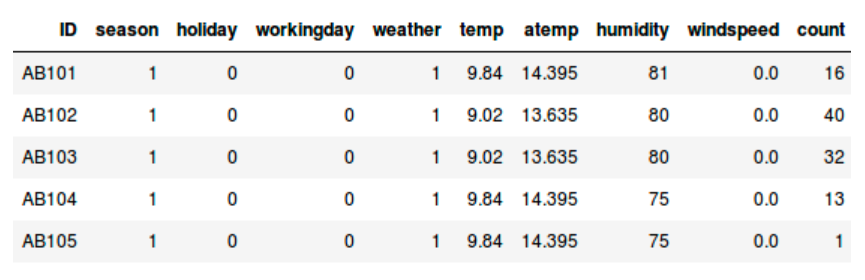

We want to predict whether a person on board the Titanic survived or not.

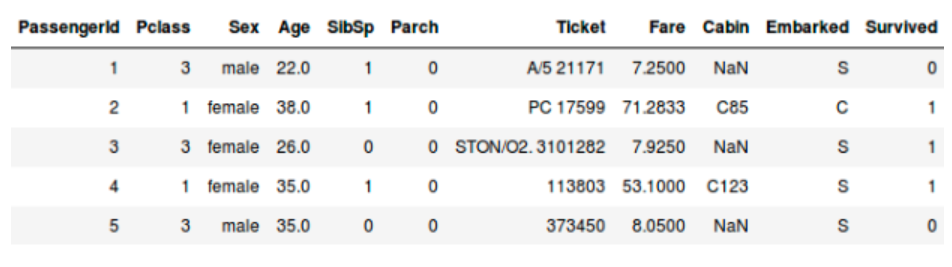

There might be situations when we do not have any target variable to predict. Such problems, without any target variable, are known as unsupervised learning problems. We only have the independent variables and no target/dependent variable in these problems.


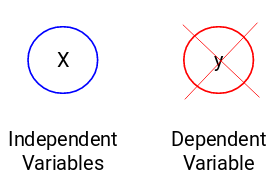

We try to divide the entire data into a set of groups in these cases. These groups are known as clusters and the process of making these clusters is known as clustering.

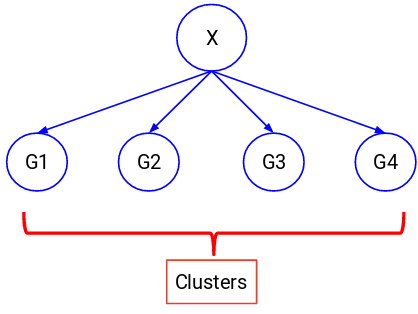

# Cluster analysis

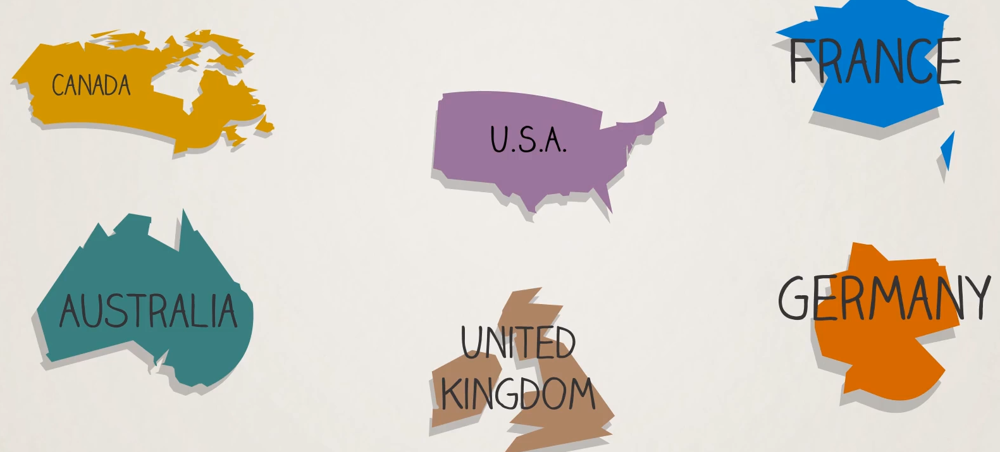

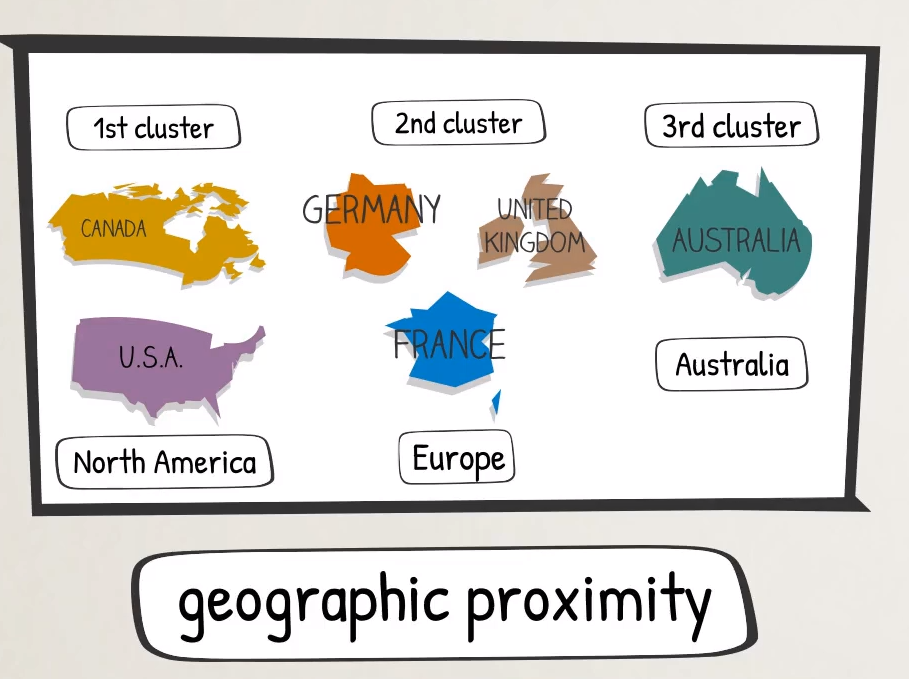

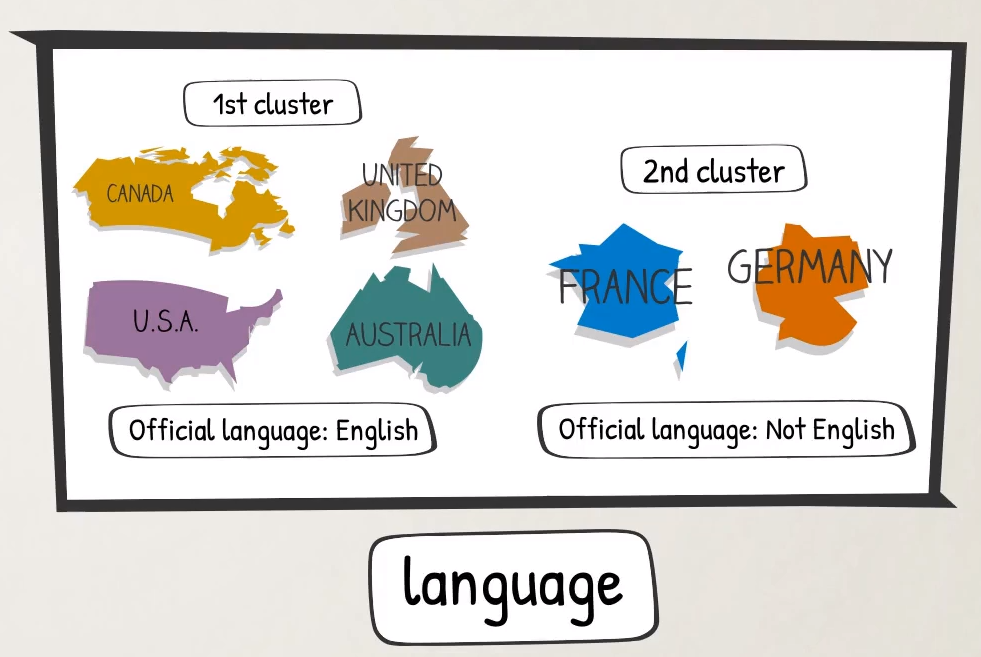

## Application areas of clustering

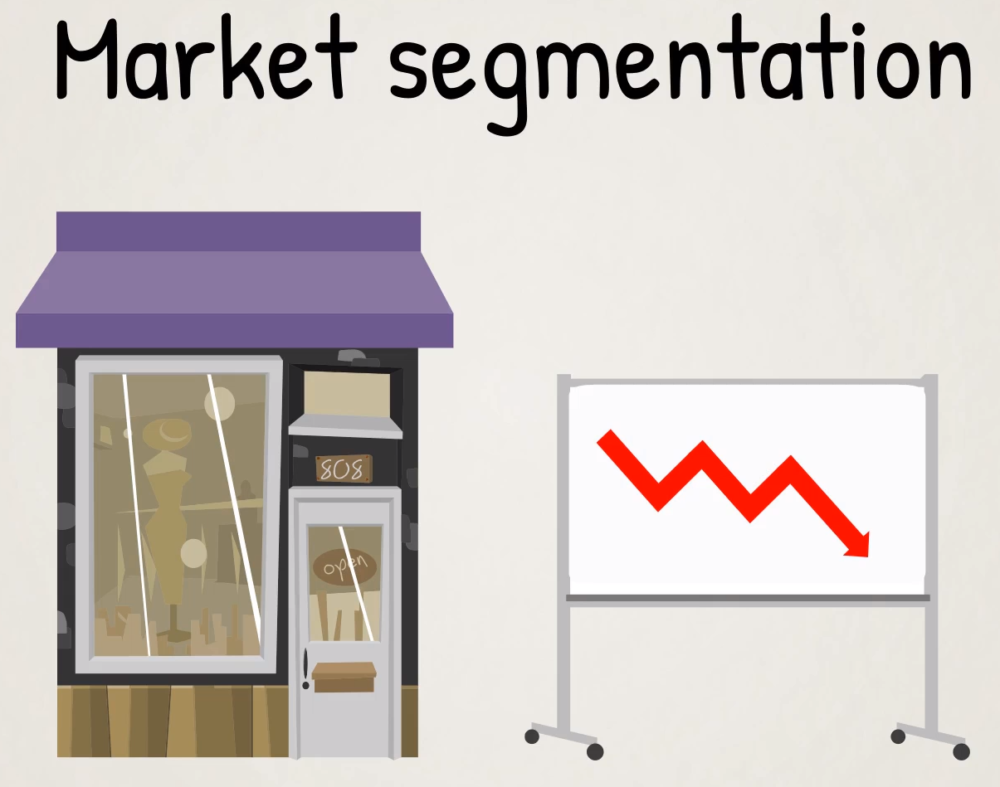

 Data Scientist is hired in order to create marketing campaign for clothing shop. Data is given but data scientist has no idea of who buys the product and decides to create a scatter plot of all customer depending on money they spent and age.

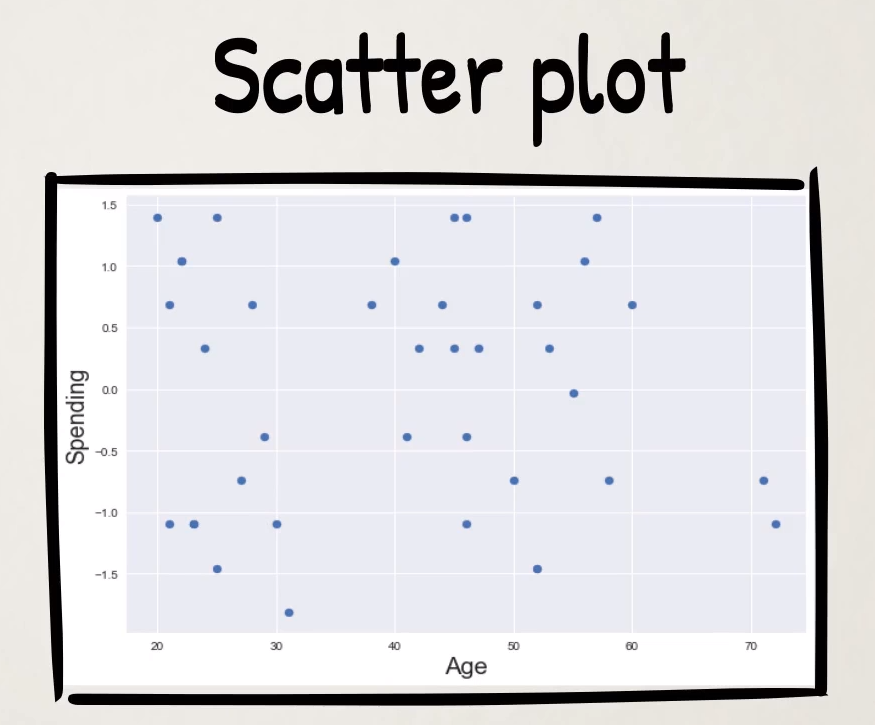

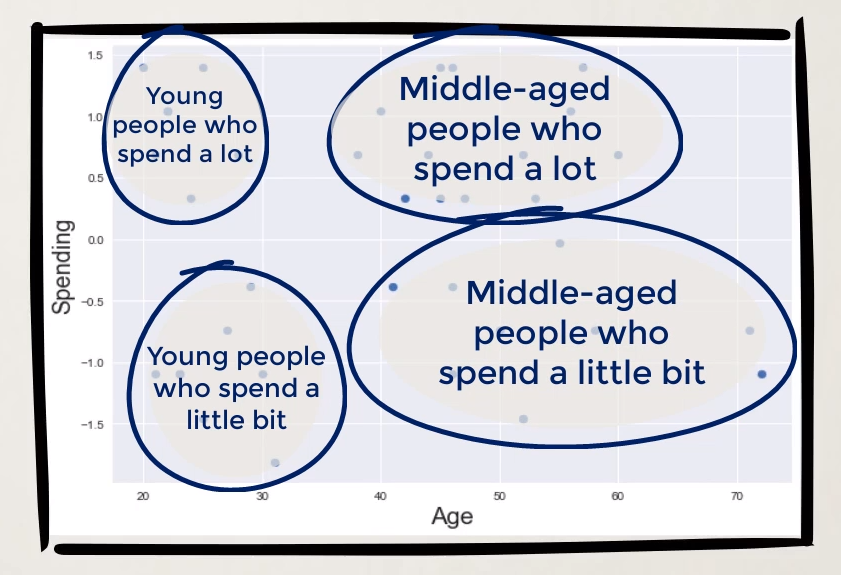

Most of data points are middle aged people who spent a lot, and that is why marketing campaign has to be created at this target.

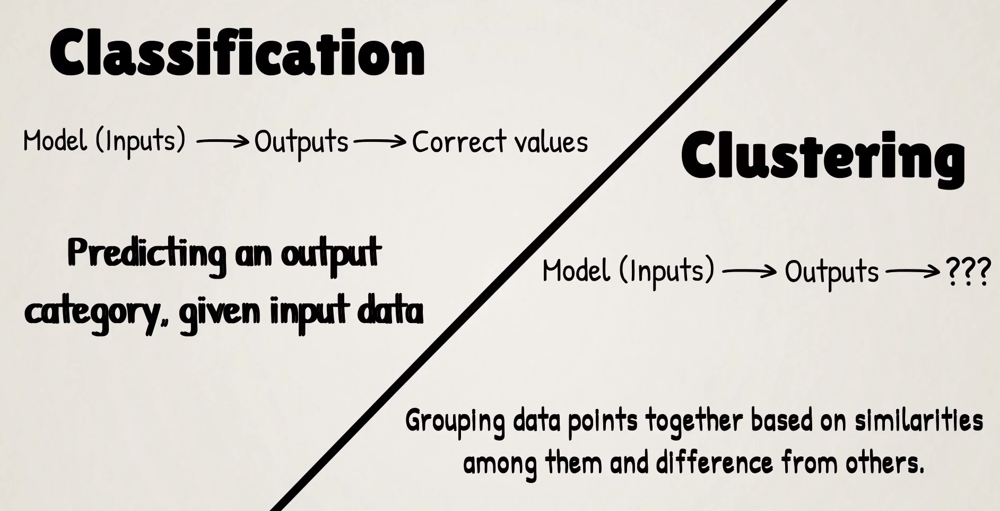

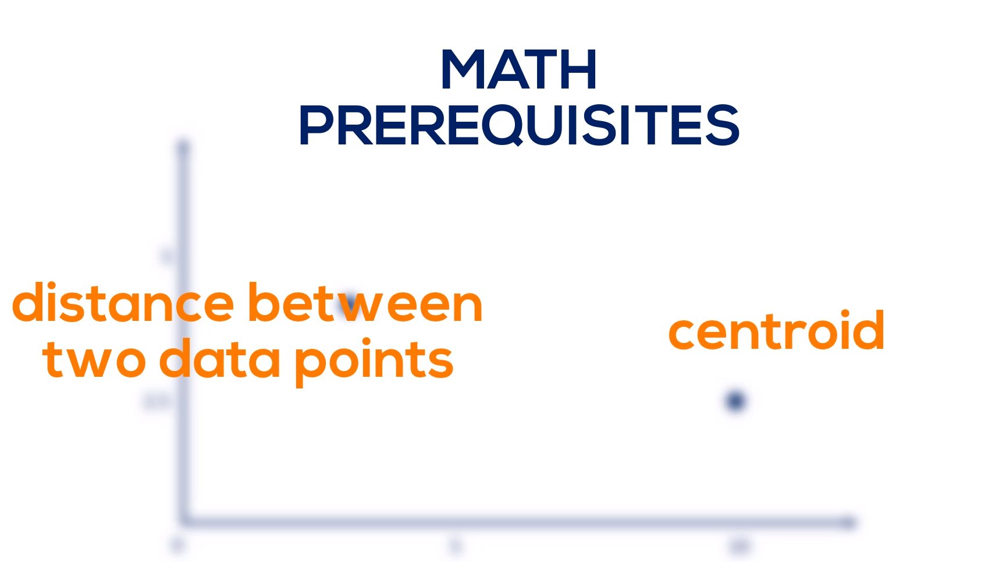

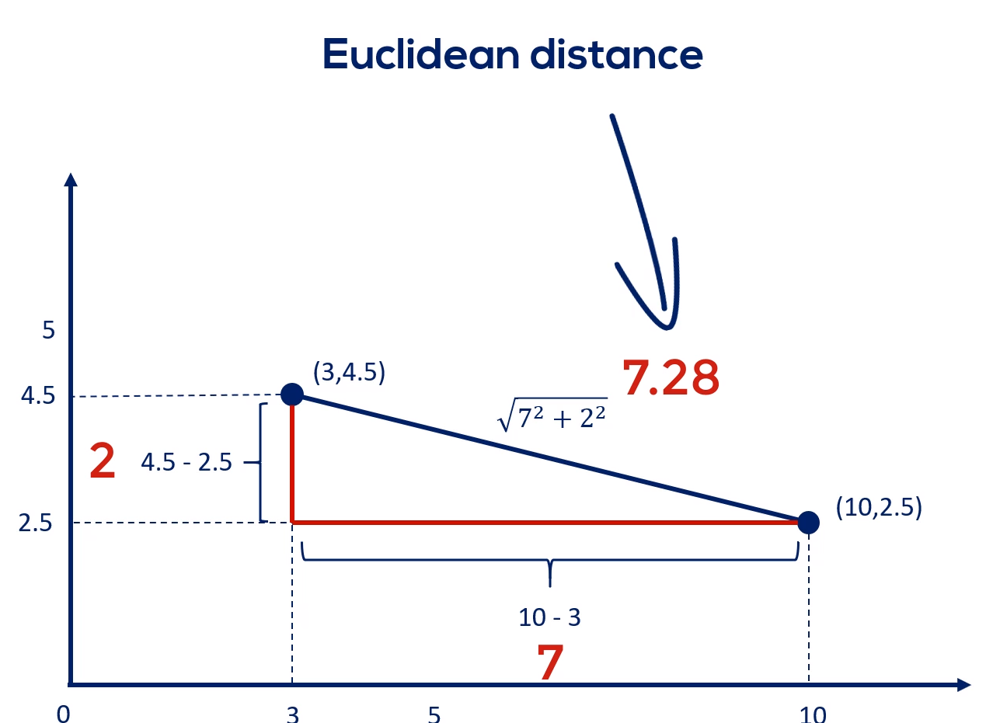

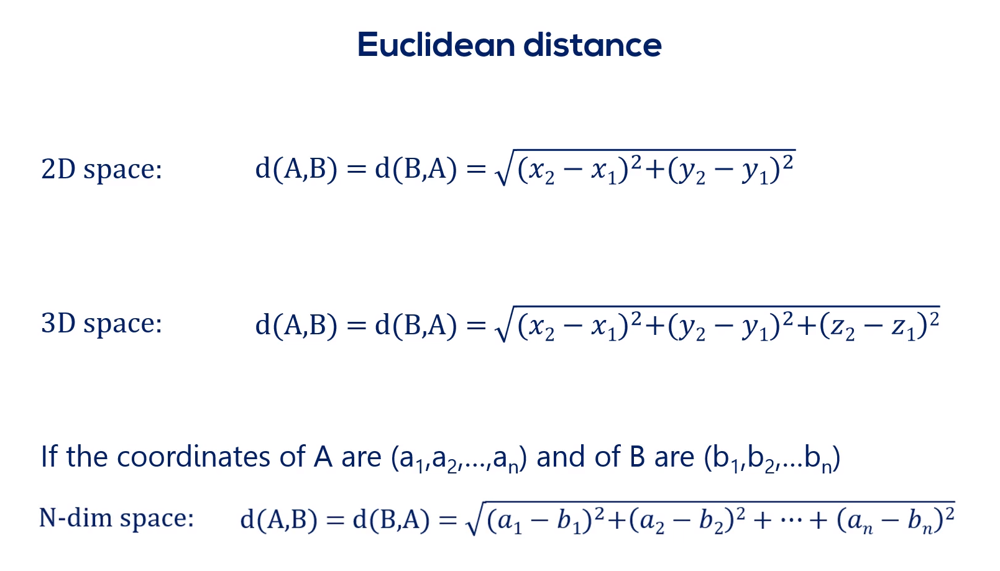

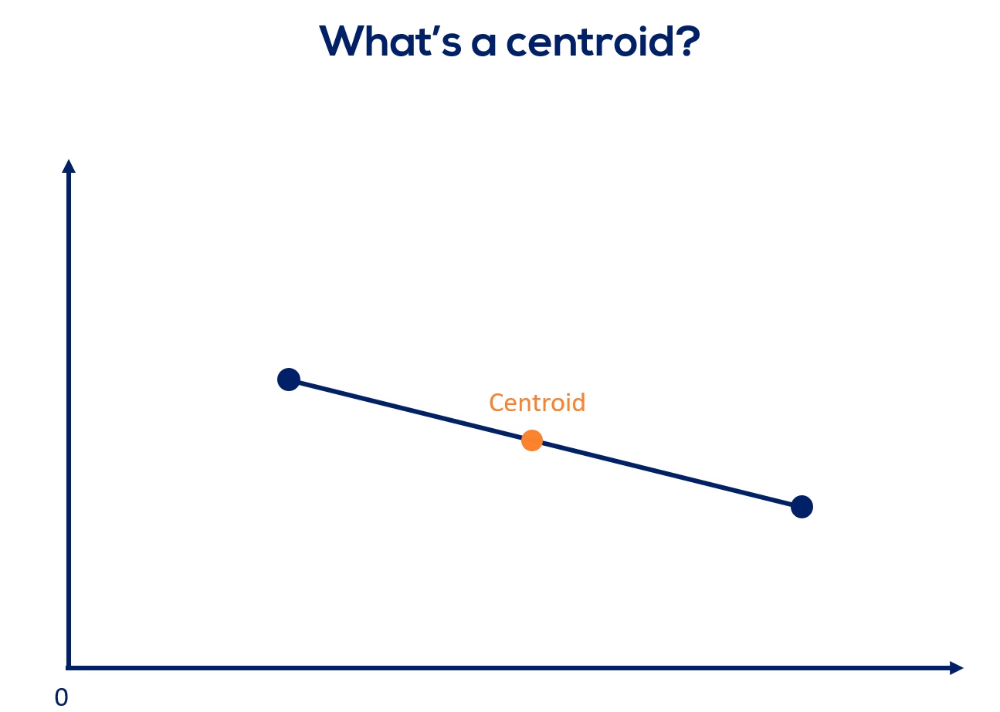

...

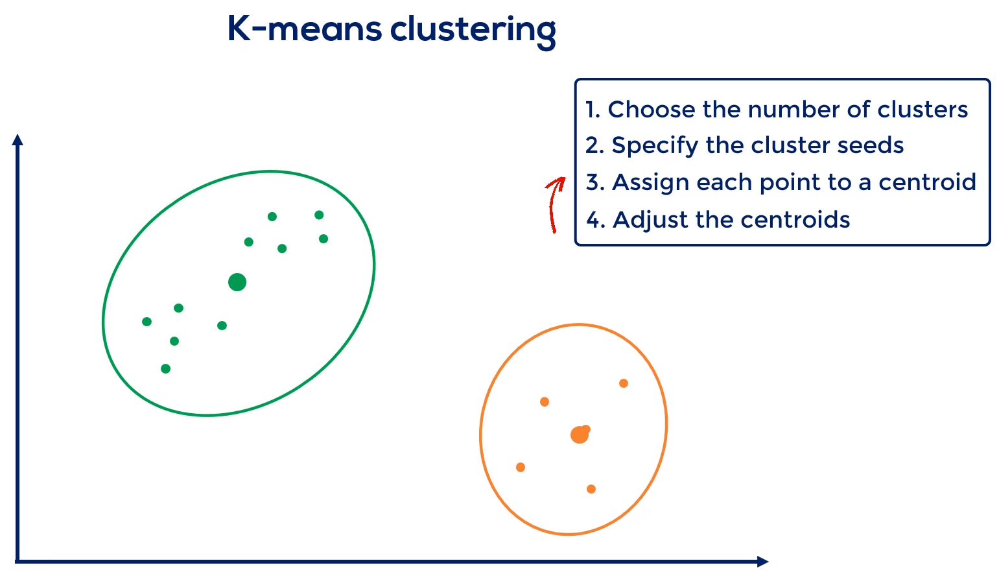

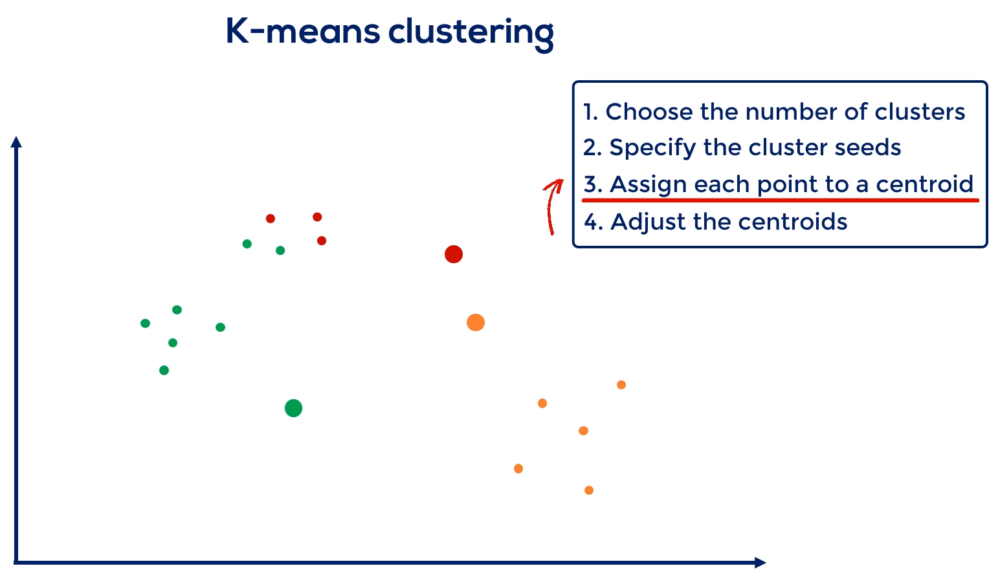

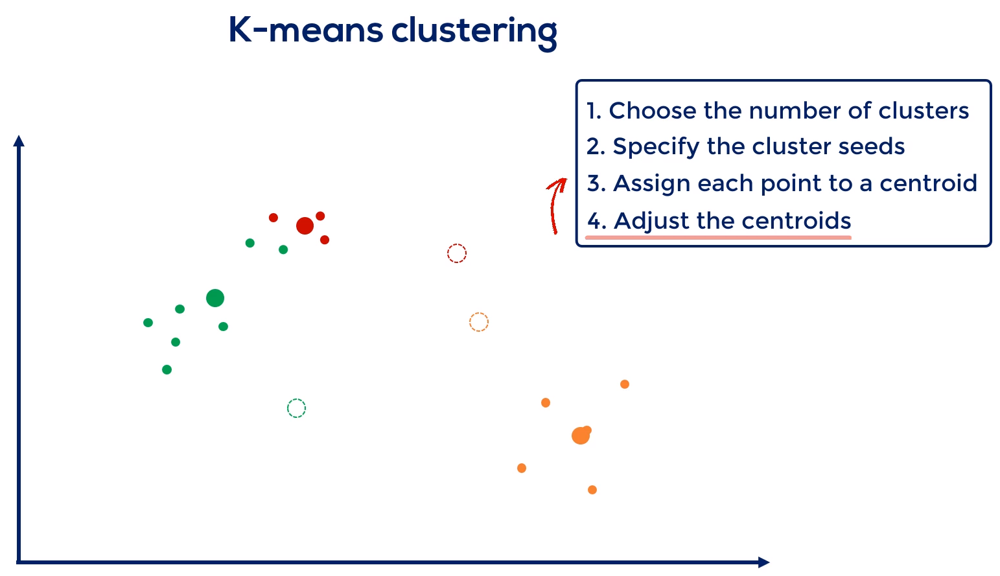

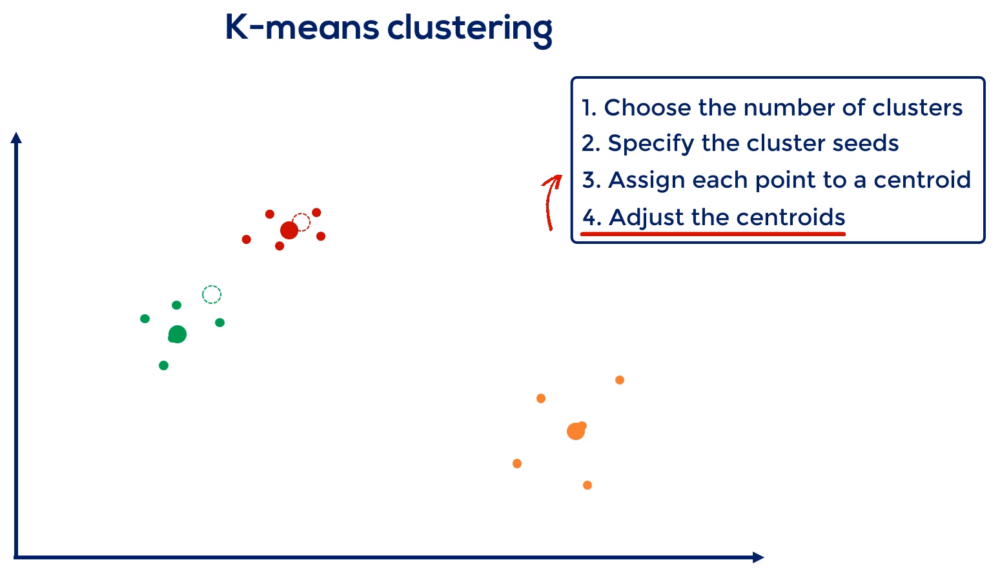

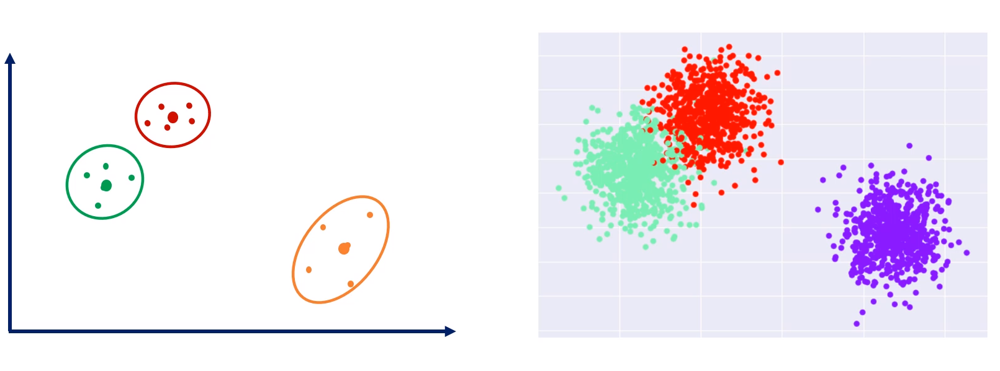

# Basics of cluster analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Set the styles to Seaborn
sns.set()

In [31]:
# Load the country clusters data
data = pd.read_csv(r'Country.csv')

In [32]:
data

,Country,Latitude,Longitude,Language
0,USA,44.97,-103.77,English
1,Canada,62.40,-96.80,English
2,France,46.75,2.40,French
3,UK,54.01,-2.53,English
4,Germany,51.15,10.40,German
5,Australia,-25.45,133.11,English
6,USA,44.97,-103.77,English
7,Canada,62.40,-96.80,English
8,France,46.75,2.40,French
9,UK,54.01,-2.53,English


<function matplotlib.pyplot.show(close=None, block=None)>

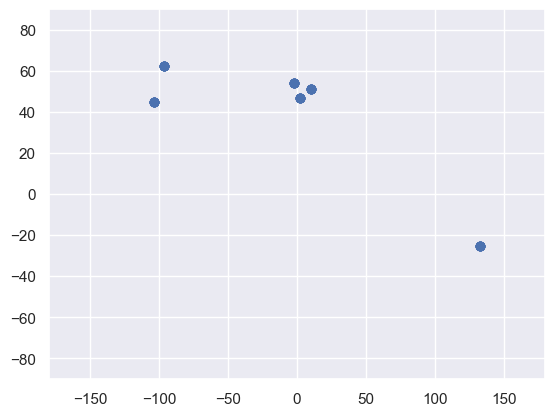

In [33]:
# Use the simplest code possible to create a scatter plot using the longitude and latitude
# Note that in order to reach a result resembling the world map, we must use the longitude as y, and the latitude as x
plt.scatter(data['Longitude'],data['Latitude'])
# Set limits of the axes, again to resemble the world map
plt.xlim(-180,180)
plt.ylim(-90,90)
plt.show

In [34]:
# select the features
x = data.iloc[:,1:3]
x

,Latitude,Longitude
0,44.97,-103.77
1,62.40,-96.80
2,46.75,2.40
3,54.01,-2.53
4,51.15,10.40
5,-25.45,133.11
6,44.97,-103.77
7,62.40,-96.80
8,46.75,2.40
9,54.01,-2.53


## Clustering

In [35]:
# Import the KMeans module so we can perform k-means clustering with sklearn
from sklearn.cluster import KMeans

# Create an object (which we would call kmeans)
# The number in the brackets is K, or the number of clusters we are aiming for
kmeans = KMeans(3)

In [36]:
# Fit the input data, i.e. cluster the data in X in K clusters
kmeans.fit(x)

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=3)

## Clustering results

In [37]:
# Create a variable which will contain the predicted clusters for each observation
identified_clusters = kmeans.fit_predict(x)
# Check the result
identified_clusters

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([1, 1, 0, 0, 0, 2, 1, 1, 0, 0, 0, 2, 1, 1, 0, 0, 0, 2, 1, 1, 0, 0,
       0, 2, 1, 1, 0, 0, 0, 2, 1, 1, 0, 0, 0, 2, 1, 1, 0, 0, 0, 2, 1, 1,
       0, 0, 0, 2], dtype=int32)

In [38]:
# Create a copy of the data
data_with_clusters = data.copy()
# Create a new Series, containing the identified cluster for each observation
data_with_clusters['Cluster'] = identified_clusters
# Check the result
data_with_clusters

,Country,Latitude,Longitude,Language,Cluster
0,USA,44.97,-103.77,English,1
1,Canada,62.40,-96.80,English,1
2,France,46.75,2.40,French,0
3,UK,54.01,-2.53,English,0
4,Germany,51.15,10.40,German,0
5,Australia,-25.45,133.11,English,2
6,USA,44.97,-103.77,English,1
7,Canada,62.40,-96.80,English,1
8,France,46.75,2.40,French,0
9,UK,54.01,-2.53,English,0


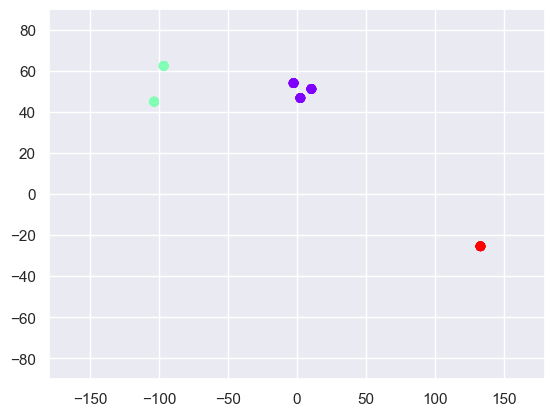

In [39]:
# Plot the data using the longitude and the latitude
# c (color) is an argument which could be coded with a variable 
# The variable in this case has values 0,1,2, indicating to plt.scatter, that there are three colors (0,1,2)
# All points in cluster 0 will be the same colour, all points in cluster 1 - another one, etc.
# cmap is the color map. 
plt.scatter(data_with_clusters['Longitude'],data_with_clusters['Latitude'],c=data_with_clusters['Cluster'],cmap='rainbow')
plt.xlim(-180,180)
plt.ylim(-90,90)
plt.show()

## Dealing with categorical variables

In [40]:
# Create a copy of the original dataset
data_mapped = data.copy()
# Map languages with 0, 1, and 2. Note that this is not the best way to do that, but for now we will use it 
data_mapped['Language']=data_mapped['Language'].map({'English':0,'French':1,'German':2})
# Check if we did it correctly
data_mapped

,Country,Latitude,Longitude,Language
0,USA,44.97,-103.77,0
1,Canada,62.40,-96.80,0
2,France,46.75,2.40,1
3,UK,54.01,-2.53,0
4,Germany,51.15,10.40,2
5,Australia,-25.45,133.11,0
6,USA,44.97,-103.77,0
7,Canada,62.40,-96.80,0
8,France,46.75,2.40,1
9,UK,54.01,-2.53,0


In [41]:
x = data_mapped.iloc[:,1:4]
x

,Latitude,Longitude,Language
0,44.97,-103.77,0
1,62.40,-96.80,0
2,46.75,2.40,1
3,54.01,-2.53,0
4,51.15,10.40,2
5,-25.45,133.11,0
6,44.97,-103.77,0
7,62.40,-96.80,0
8,46.75,2.40,1
9,54.01,-2.53,0


In [42]:
kmeans = KMeans(4)

In [43]:
kmeans.fit(x)

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=4)

In [44]:
# Create a variable which will contain the predicted clusters for each observation
identified_clusters = kmeans.fit_predict(x)
# Check the result
identified_clusters

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([3, 2, 0, 0, 0, 1, 3, 2, 0, 0, 0, 1, 3, 2, 0, 0, 0, 1, 3, 2, 0, 0,
       0, 1, 3, 2, 0, 0, 0, 1, 3, 2, 0, 0, 0, 1, 3, 2, 0, 0, 0, 1, 3, 2,
       0, 0, 0, 1], dtype=int32)

In [45]:
# Create a copy of the mapped data
data_with_clusters = data_mapped.copy()
# Create a new Series, containing the identified cluster for each observation
data_with_clusters['Cluster'] = identified_clusters
# Check the result
data_with_clusters

,Country,Latitude,Longitude,Language,Cluster
0,USA,44.97,-103.77,0,3
1,Canada,62.40,-96.80,0,2
2,France,46.75,2.40,1,0
3,UK,54.01,-2.53,0,0
4,Germany,51.15,10.40,2,0
5,Australia,-25.45,133.11,0,1
6,USA,44.97,-103.77,0,3
7,Canada,62.40,-96.80,0,2
8,France,46.75,2.40,1,0
9,UK,54.01,-2.53,0,0


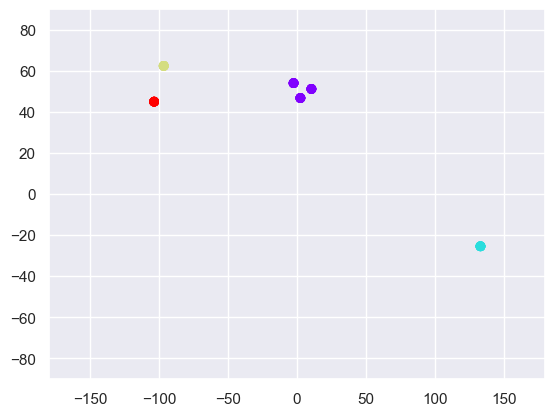

In [46]:
plt.scatter(data_with_clusters['Longitude'],data_with_clusters['Latitude'],c=data_with_clusters['Cluster'],cmap='rainbow')
plt.xlim(-180,180)
plt.ylim(-90,90)
plt.show()

# How to choose number of clusters?


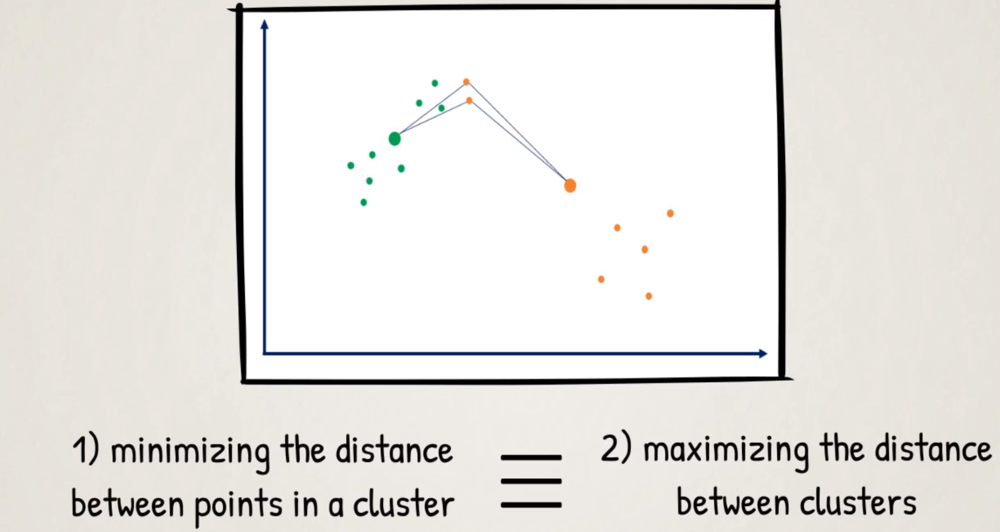

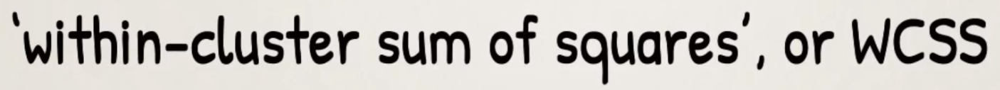

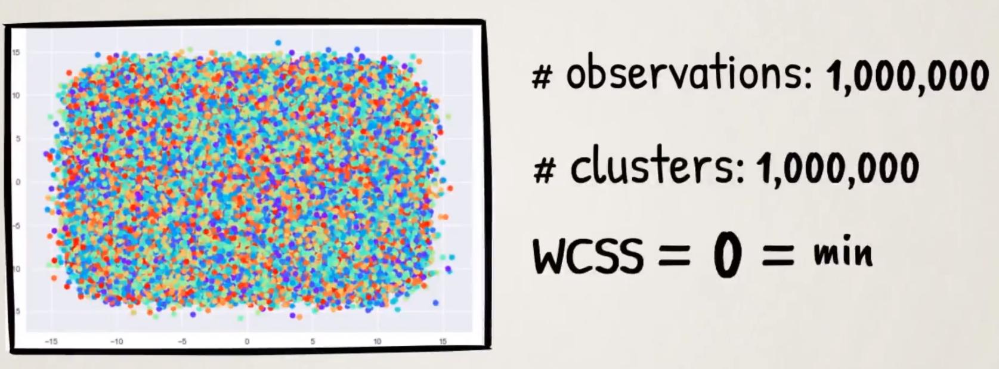

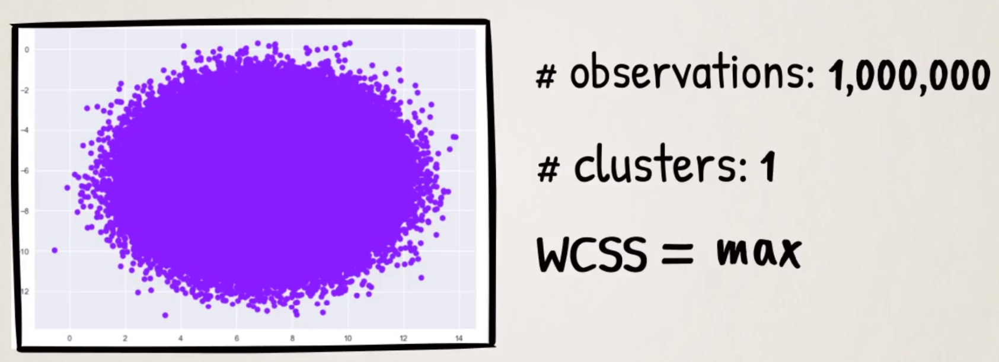

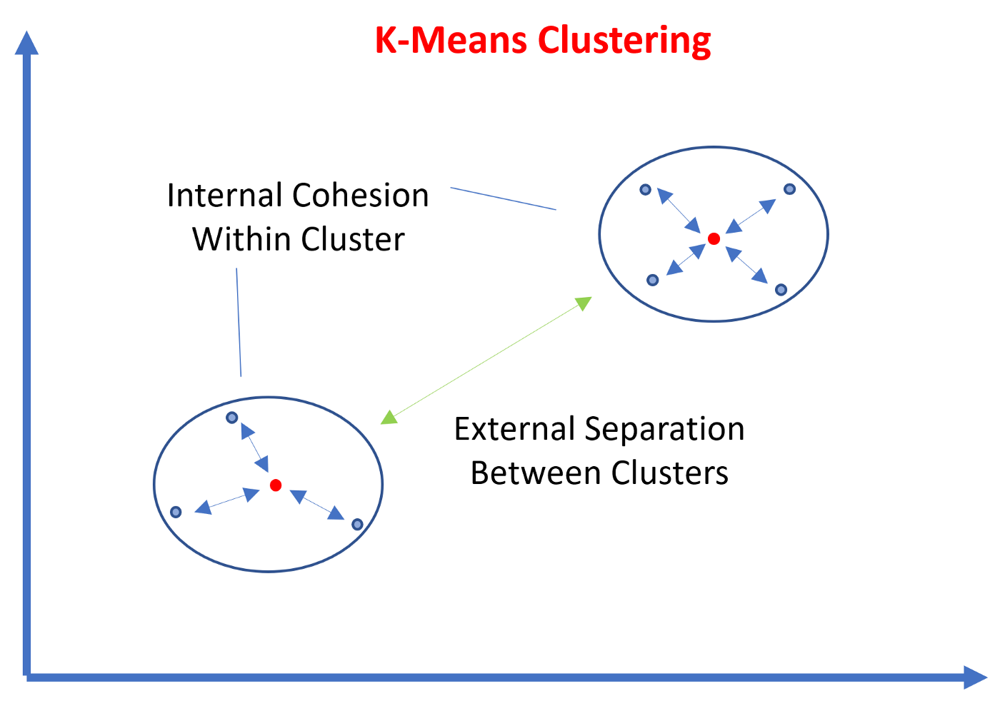

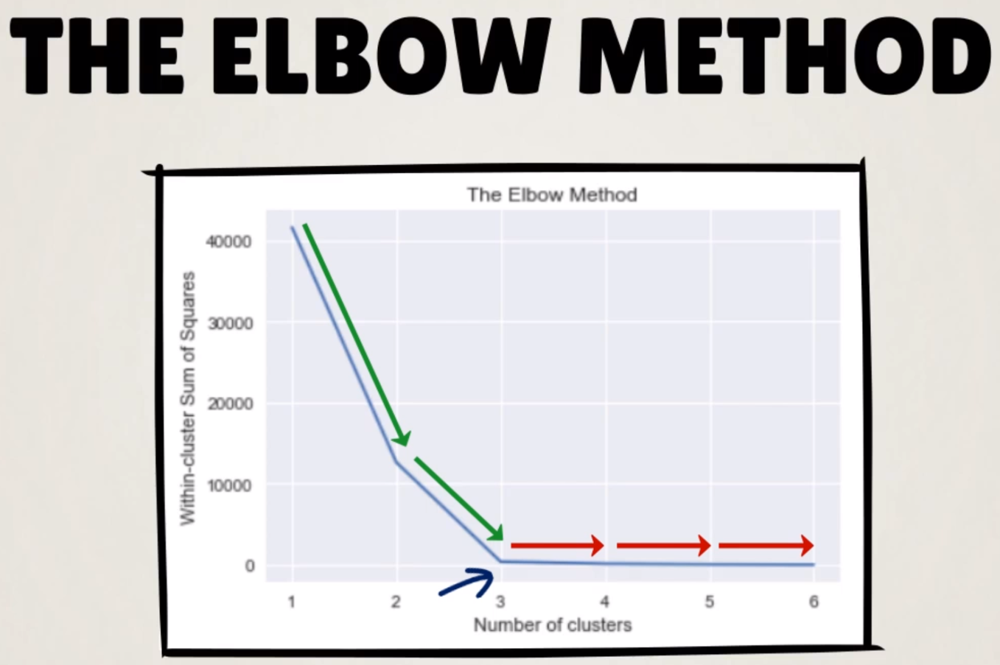

## Selecting the number of clusters

### WCSS (within-cluster sum of squares)
WCSS is a measure developed within the ANOVA framework. It gives a very good idea about the different distance between different clusters and within clusters, thus providing us a rule for deciding the appropriate number of clusters.

In [47]:
# Get the WCSS for the current solution
# Sum of squared distances of samples to their closest cluster center.
kmeans.inertia_

911.2986666666666

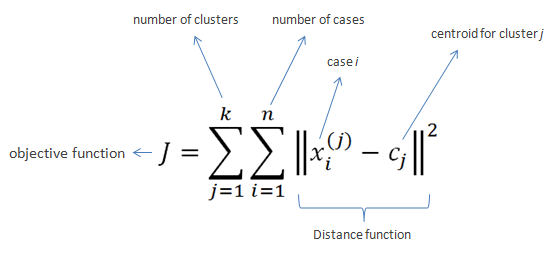

In [52]:
# Create an empty list
wcss=[]

# Create all possible cluster solutions with a loop
for i in range(1,7):
    # Cluster solution with i clusters
    kmeans = KMeans(i)
    # Fit the data
    kmeans.fit(x)
    # Find WCSS for the current iteration
    wcss_iter = kmeans.inertia_
    # Append the value to the WCSS list
    wcss.append(wcss_iter)

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of

In [53]:
wcss

[340843.30853333336,
 105671.66496,
 2320.8418666666666,
 911.2986666666666,
 312.0499999999999,
 1.0097419586828951e-28]

Text(0, 0.5, 'Within-cluster Sum of Squares')

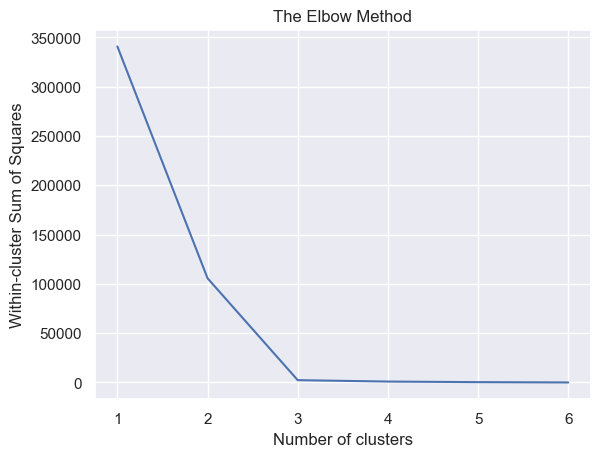

In [55]:
# Create a variable containing the numbers from 1 to 6, so we can use it as X axis of the future plot
number_clusters = range(1,7)
# Plot the number of clusters vs WCSS
plt.plot(number_clusters,wcss)
# Name your graph
plt.title('The Elbow Method')
# Name the x-axis
plt.xlabel('Number of clusters')
# Name the y-axis
plt.ylabel('Within-cluster Sum of Squares')

In [56]:
kmeans = KMeans(3)
kmeans.fit(x)

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=3)

In [57]:
labels = kmeans.fit_predict(x)

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [58]:
data_with_clusters['Cluster'] = labels

data_with_clusters

,Country,Latitude,Longitude,Language,Cluster
0,USA,44.97,-103.77,0,0
1,Canada,62.40,-96.80,0,0
2,France,46.75,2.40,1,1
3,UK,54.01,-2.53,0,1
4,Germany,51.15,10.40,2,1
5,Australia,-25.45,133.11,0,2
6,USA,44.97,-103.77,0,0
7,Canada,62.40,-96.80,0,0
8,France,46.75,2.40,1,1
9,UK,54.01,-2.53,0,1


## The Silhouette score

The Silhouette score is a metric used to evaluate how good clustering results are in data clustering. This score is calculated by measuring each data point’s similarity to the cluster it belongs to and how different it is from other clusters

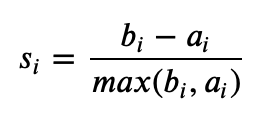

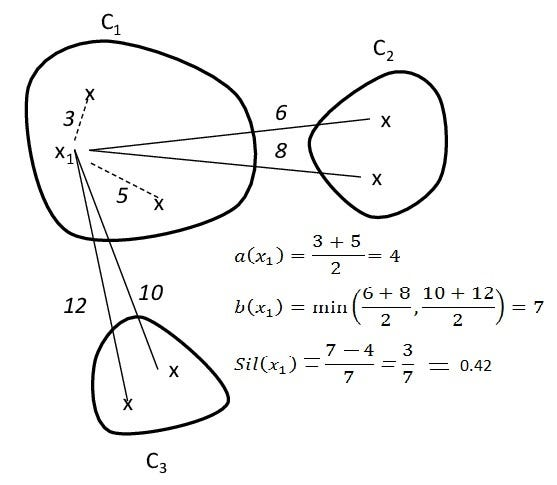

## Key characteristics of the Silhouette score include:

### It ranges from -1 to +1:

Positive values indicate that data points belong to the correct clusters, indicating good clustering results.

A score of zero suggests overlapping clusters or data points equally close to multiple clusters.

Negative values indicate that data points are assigned to incorrect clusters, indicating poor clustering results.

In [59]:
from sklearn.metrics import silhouette_score

In [60]:
silhouette_avg = silhouette_score(x, labels)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.932914703129474


- K-Means is an iterative process. It will keep on running until the centroids of newly formed clusters do not change or the maximum number of iterations are reached.

Disadvantages

- It always tries to make clusters of the same size. 
- We have to decide the number of clusters at the beginning of the algorithm. 
- We would not know how many clusters should we have, in the beginning of the algorithm

# Hierarchical Clustering

 It takes away the problem of having to pre-define the number of clusters.

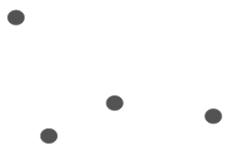

We have the above points and we want to cluster them into groups and we can assign each of these points to a separate cluster.

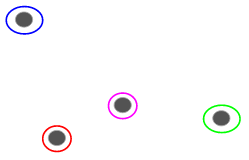

 based on the similarity of these clusters, we can combine the most similar clusters together and repeat this process until only a single cluster is left. We are  building a hierarchy of clusters. That’s why this algorithm is called hierarchical clustering. 

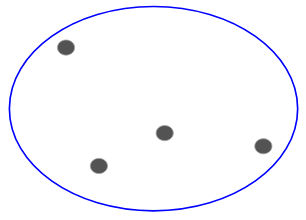

## Types of Hierarchical Clustering


- Agglomerative hierarchical clustering
- Divisive Hierarchical clustering

# Agglomerative Hierarchical Clustering

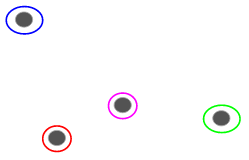

We assign each point to an individual cluster in this technique. Suppose there are 4 data points. We will assign each of these points to a cluster and hence will have 4 clusters in the beginning. 

Then, at each iteration, we merge the closest pair of clusters and repeat this step until only a single cluster is left.

We are merging (or adding) the clusters at each step , hence, this type of clustering is also known as additive hierarchical clustering.

 

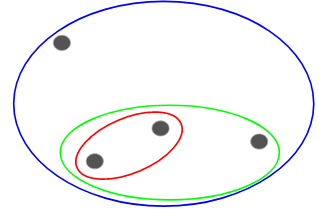

# Divisive Hierarchical Clustering


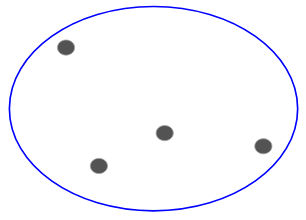

Divisive hierarchical clustering works in the opposite way. Instead of starting with n clusters (in case of n observations), we start with a single cluster and assign all the points to that cluster.

So, it doesn’t matter if we have 10 or 1000 data points. All these points will belong to the same cluster at the beginning.

Now, at each iteration, we split the farthest point in the cluster and repeat this process until each cluster only contains a single point.

We are splitting (or dividing) the clusters at each step, hence the name divisive hierarchical clustering.

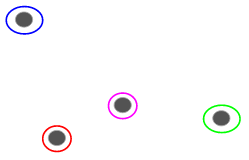

## Steps to Perform Hierarchical Clustering

How do we decide which points are similar and which are not?

- Take the distance between the centroids of these clusters. 
- The points having the least distance are referred to as similar points and we can merge them. 

In hierarchical clustering, we have a concept called a proximity matrix.

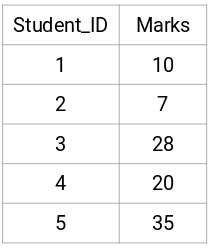

## Creating a Proximity Matrix


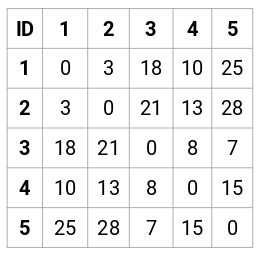

## Steps to Perform Hierarchical Clustering


Step 1: First, we assign all the points to an individual cluster:

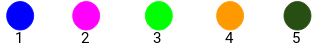

Step 2: Next, we will look at the smallest distance in the proximity matrix and merge the points with the smallest distance. We then update the proximity matrix:

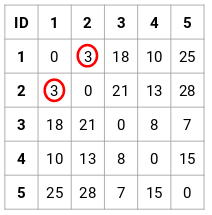

the smallest distance is 3 and hence we will merge point 1 and 2:

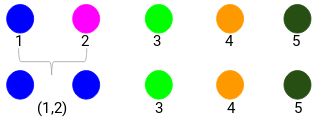

we have taken the maximum of the two marks (7, 10) to replace the marks for this cluster. Instead of the maximum, we can also take the minimum value or the average values as well

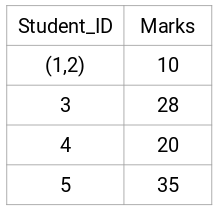

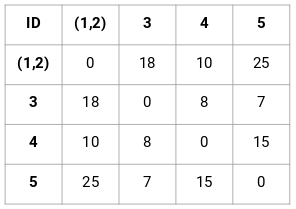

Step 3: We will repeat step 2 until only a single cluster is left.


we will first look at the minimum distance in the proximity matrix and then merge the closest pair of clusters. We will get the merged clusters as shown below after repeating these steps:

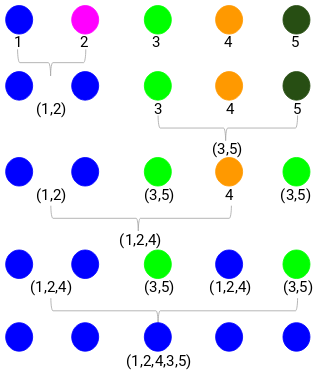

## How should we Choose the Number of Clusters in Hierarchical Clustering?

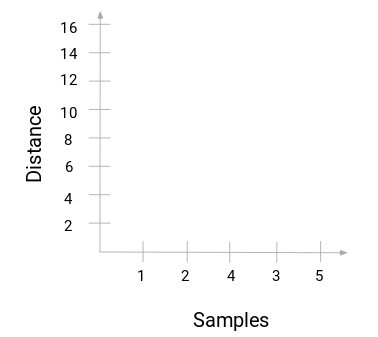

A dendrogram is a diagram that records the sequences of merges or splits.

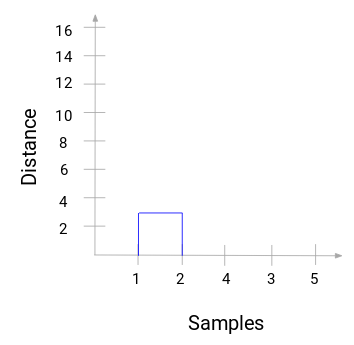

We started by merging sample 1 and 2 and the distance between these two samples was 3

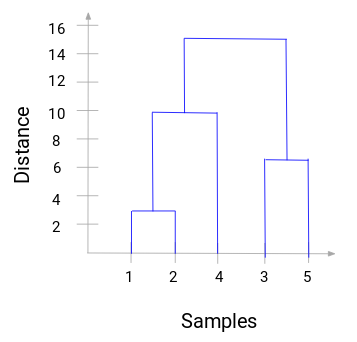

Now, we can set a threshold distance and draw a horizontal line . Generally, we try to set the threshold in such a way that it cuts the tallest vertical line

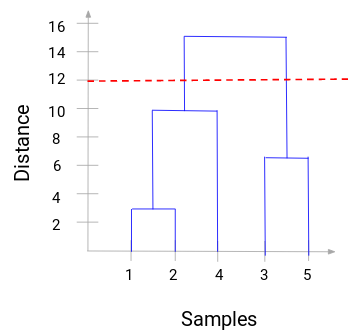

since the red line intersects 2 vertical lines, we will have 2 clusters. One cluster will have a sample (1,2,4) and the other will have a sample (3,5)

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Attribute Information:

FRESH: annual spending (m.u.) on fresh products 

MILK: annual spending (m.u.) on milk products

GROCERY: annual spending (m.u.)on grocery products

FROZEN: annual spending (m.u.)on frozen products

DETERGENTS_PAPER: annual spending (m.u.) on detergents and paper products 

DELICATESSEN: annual spending (m.u.)on and delicatessen products 

CHANNEL: customers Channel - Horeca (Hotel/Restaurant/Cafe) or Retail channel 

REGION: customers Region Lisnon, Oporto or Other 

In [62]:
data = pd.read_csv(r'Wholesale customers data.csv')
data

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185
...,...,...,...,...,...,...,...,...
435,1,3,29703,12051,16027,13135,182,2204
436,1,3,39228,1431,764,4510,93,2346
437,2,3,14531,15488,30243,437,14841,1867
438,1,3,10290,1981,2232,1038,168,2125


In [63]:
from sklearn.preprocessing import normalize
data_scaled = normalize(data)
data_scaled = pd.DataFrame(data_scaled, columns=data.columns)
data_scaled.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,0.000112,0.000168,0.708333,0.539874,0.422741,0.011965,0.149505,0.074809
1,0.000125,0.000188,0.442198,0.614704,0.599540,0.110409,0.206342,0.111286
2,0.000125,0.000187,0.396552,0.549792,0.479632,0.150119,0.219467,0.489619
3,0.000065,0.000194,0.856837,0.077254,0.272650,0.413659,0.032749,0.115494
4,0.000079,0.000119,0.895416,0.214203,0.284997,0.155010,0.070358,0.205294


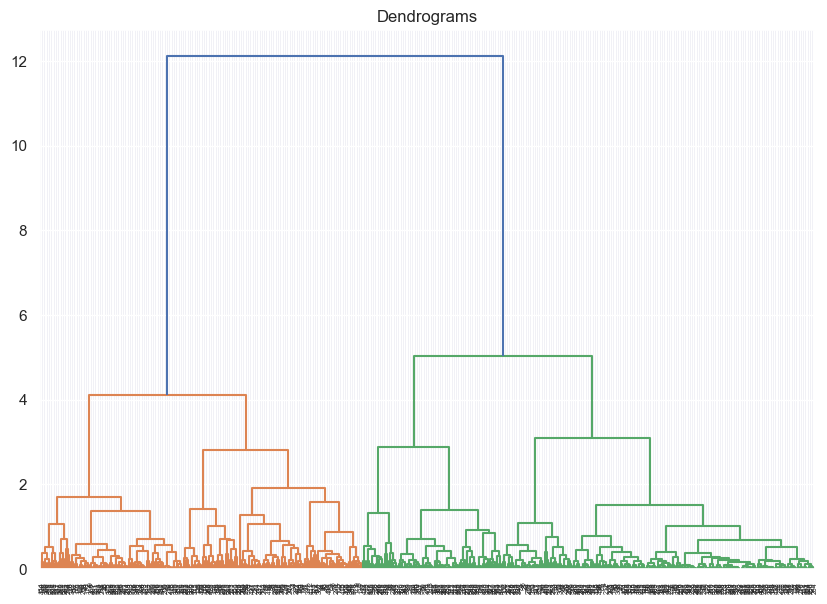

In [64]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(data_scaled, method='ward'))

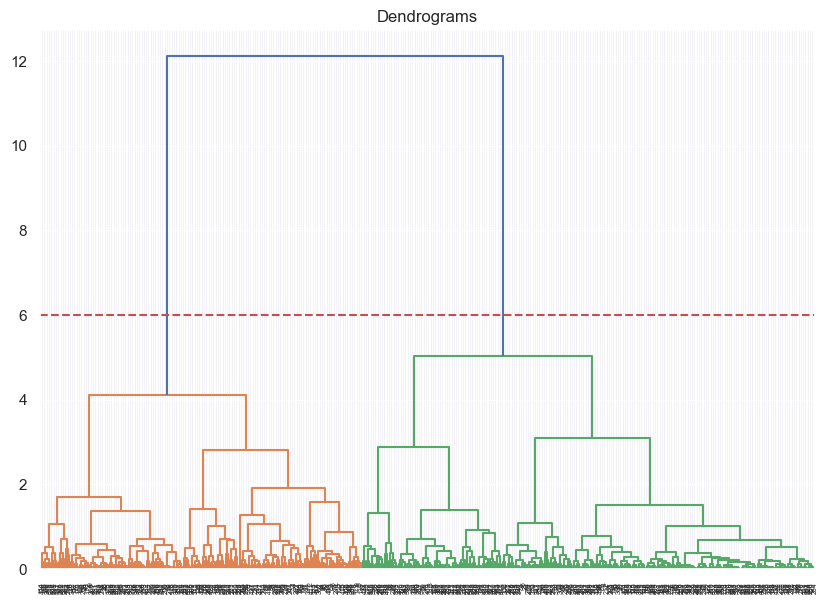

In [65]:
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(data_scaled, method='ward'))
plt.axhline(y=6, color='r', linestyle='--')

In [66]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')  
y = cluster.fit_predict(data_scaled)

y

/Users/personal_mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0,

In [68]:
data

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185
...,...,...,...,...,...,...,...,...
435,1,3,29703,12051,16027,13135,182,2204
436,1,3,39228,1431,764,4510,93,2346
437,2,3,14531,15488,30243,437,14841,1867
438,1,3,10290,1981,2232,1038,168,2125


In [69]:
data['dependent_value'] = y

data

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,dependent_value
0,2,3,12669,9656,7561,214,2674,1338,1
1,2,3,7057,9810,9568,1762,3293,1776,1
2,2,3,6353,8808,7684,2405,3516,7844,1
3,1,3,13265,1196,4221,6404,507,1788,0
4,2,3,22615,5410,7198,3915,1777,5185,0
...,...,...,...,...,...,...,...,...,...
435,1,3,29703,12051,16027,13135,182,2204,0
436,1,3,39228,1431,764,4510,93,2346,0
437,2,3,14531,15488,30243,437,14841,1867,1
438,1,3,10290,1981,2232,1038,168,2125,0


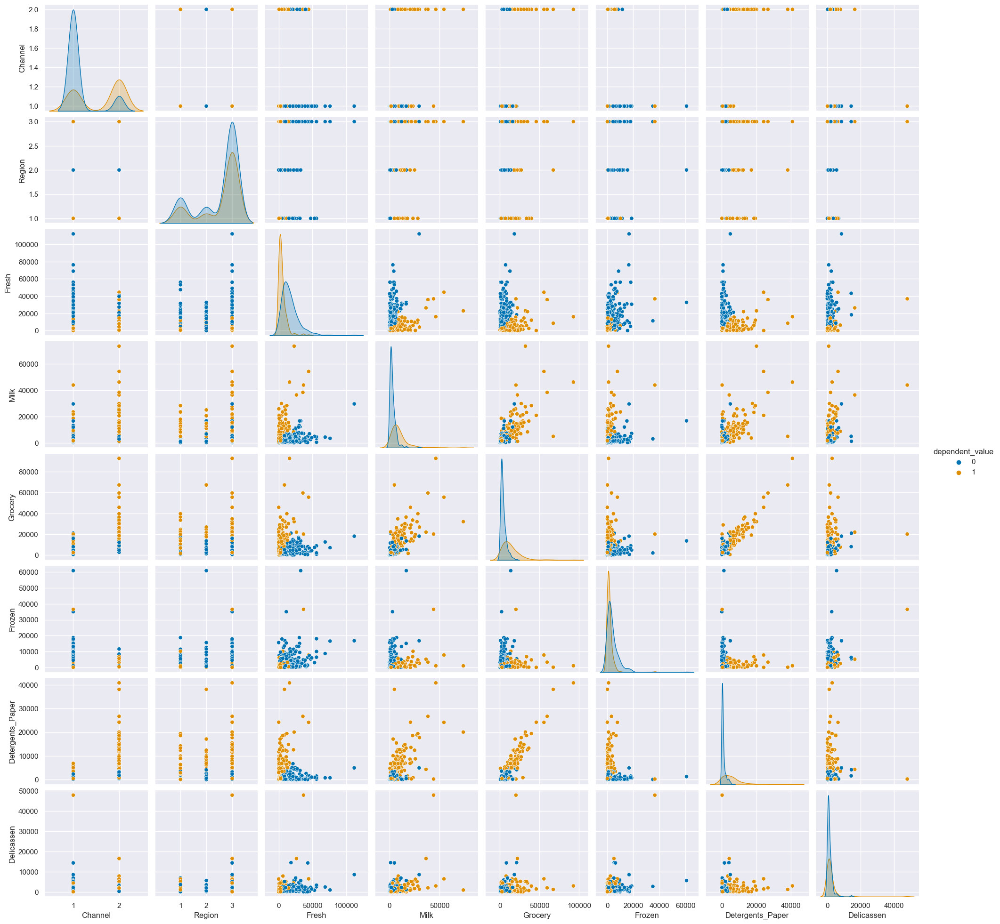

In [79]:
sns.pairplot(data,hue='dependent_value',palette='colorblind')

In [70]:
silhouette_avg = silhouette_score(data_scaled, y)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.49090467744510174


In [71]:
X = data_scaled.copy()
y = data['dependent_value']

In [72]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [73]:
def evaluate(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:,1]

    roc_pred = roc_auc_score(y_test, y_pred)
    roc_prob = roc_auc_score(y_test, y_prob)
    
    gini_pred = roc_pred*2-1
    gini_prob = roc_prob*2-1
    
    print('Model Performance')

    print('Gini pred is', gini_pred*100)
    print('Gini prob is', gini_prob*100)
    
    return gini_pred
    return gini_prob

In [74]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

base_model = RandomForestClassifier(n_estimators = 100, random_state = 42)
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

Model Performance
Gini pred is 90.64935064935065
Gini prob is 99.3388429752066
